# Poke around

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import scipy
from scipy import signal
from matplotlib import pyplot as plt
import hvplot.xarray

In [2]:
fn = '/datadrive/NCCFs/old/6year_NCCF_201.nc'
da = xr.open_dataarray(fn)

In [16]:
da_f = xr.DataArray(scipy.fft.fft(da[::50,:].loc[:,-10:0].values, axis=1), dims=['dates', 'frequency'], coords={'dates':da.dates[::50], 'frequency':np.linspace(0,200,2000)})

In [24]:
np.abs(da_f).hvplot(x='dates', y='frequency', rasterize=True, cnorm='log', cmap='inferno')

:DynamicMap   []
   :Image   [dates,frequency]   (value)

In [37]:
da_f_angle = xr.DataArray(np.angle(da_f), dims=da_f.dims, coords=da_f.coords, name='angle')

(200.0, 300.0)

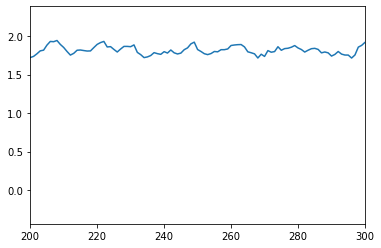

In [73]:
plt.plot(np.unwrap(da_f_angle[:,10][~np.isnan(da_f_angle[:,300])]))
plt.xlim([200,300])

In [4]:
s1b0_t = da.loc[:,-3.5:-2.5].values

In [83]:
s1b0_t.shape

(52407, 200)

In [95]:
s1b0_t_zp = np.append(s1b0_t, np.zeros((s1b0_t.shape[0], 500)), axis=1)

In [97]:
s1b0_f = scipy.fft.fft(s1b0_t_zp, axis=1)
#s1b0_phi = np.angle(s1b0_f)

Text(0, 0.5, 'frequency [Hz]')

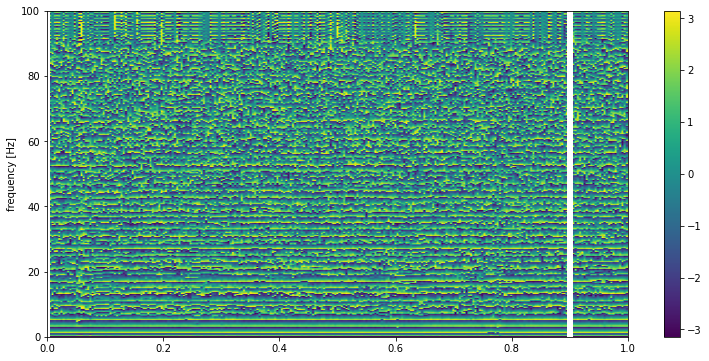

In [102]:
fig = plt.figure(figsize=(13,6))
plt.imshow(np.angle(s1b0_f[::201,:]).T, aspect='auto', extent=(0,1, 200,0))
plt.colorbar()
plt.ylim([0,100])
plt.ylabel('frequency [Hz]')

In [57]:
da.shape[0]

52407

Text(0, 0.5, 'frequency [Hz]')

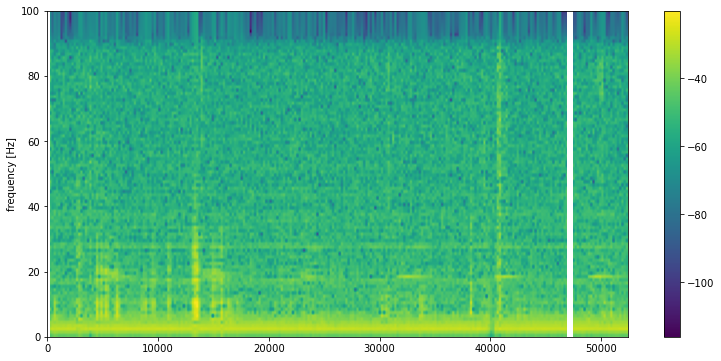

In [58]:
fig = plt.figure(figsize=(13,6))
plt.imshow(20*np.log10(np.abs(s1b0_f[::201,:100])).T, aspect='auto', extent=(0,da.shape[0], 100,0))
plt.colorbar()
plt.ylim([0,100])
plt.ylabel('frequency [Hz]')

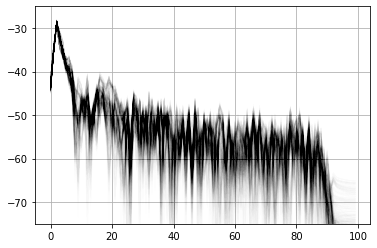

In [69]:
_ = plt.plot(20*np.log10(np.abs(s1b0_f[25000:26000,:100])).T, c='k', alpha=0.005)
plt.ylim([-75, -25])
plt.grid()

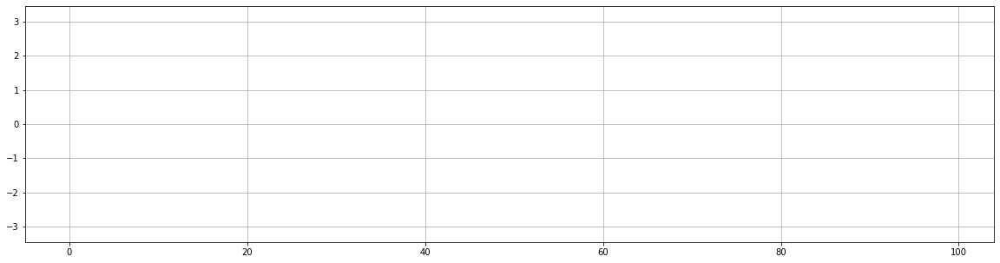

In [104]:
fig = plt.figure(figsize=(20,5))
_ = plt.plot(np.angle(s1b0_f[25000:30000,:100]).T, '.', c='k', alpha=0.001)
plt.grid()

## Look at entire frequency domain

In [107]:
da_f = scipy.fft.fft(da.values, axis=1)

/tmp/ipykernel_1843/673002659.py:2: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(20*np.log10(np.abs(da_f[::201,:])).T, aspect='auto', extent=(0,1,0,200))


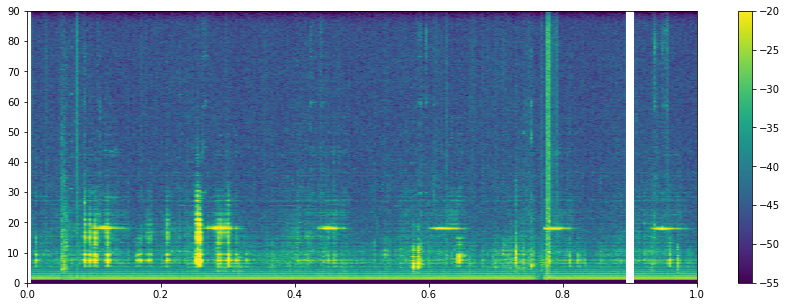

In [124]:
fig = plt.figure(figsize=(15,5))
plt.imshow(20*np.log10(np.abs(da_f[::201,:])).T, aspect='auto', extent=(0,1,0,200))
plt.ylim([0,90])
plt.colorbar()
plt.clim([-20, -50])

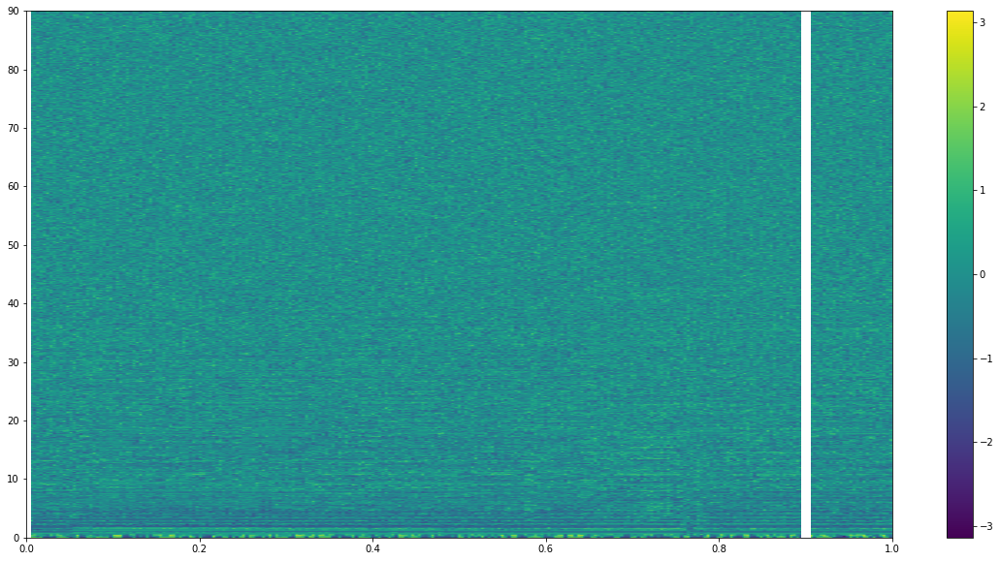

In [128]:
fig = plt.figure(figsize=(20,10))
plt.imshow(np.angle(da_f[::201,:]).T, aspect='auto', extent=(0,1,0,200))
plt.ylim([0,90])
plt.colorbar()

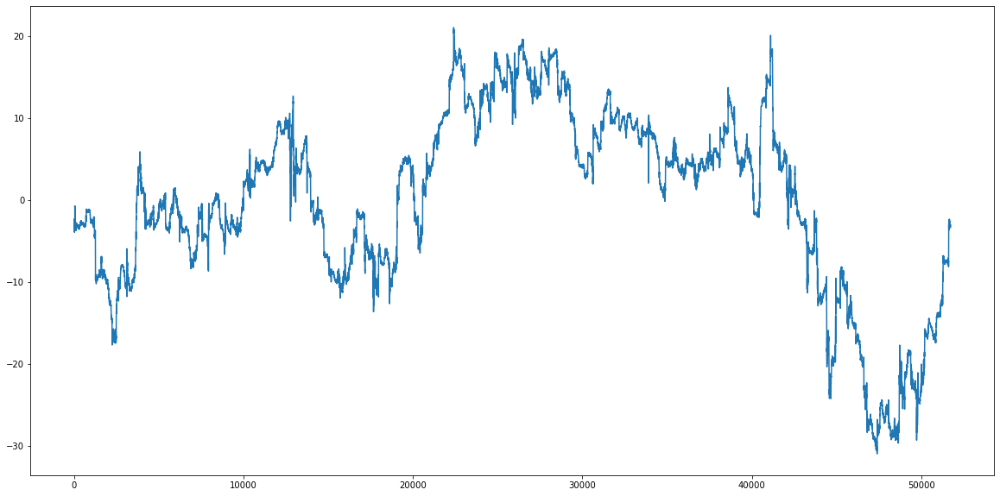

In [155]:
f = np.linspace(0,200,11999)
fidx = np.argmin(np.abs(f - 70))

fig = plt.figure(figsize=(20,10))
plt.plot(np.unwrap(np.angle(da_f[:,fidx])[~np.isnan(np.angle(da_f[:,fidx]))]))

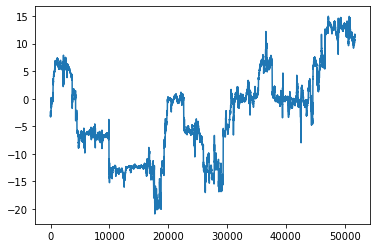

In [149]:
plt.plot(np.unwrap(np.angle(da_f[:,fidx])[~np.isnan(np.angle(da_f[:,fidx]))]))